## Feature Engineering

In this notebook we transform the data into feature vectors. We want the feature vectors to capture information about the messages, which can be used to identify the catagory or classification of message.

We begin by loading in our training set:

In [1]:
import numpy as np
import pandas as pd

In [2]:
training_data = pd.read_parquet("./data/training.parquet")
training_data.sample(10)

,Message,Subject,Catagory
14816,"In article <1993Apr22.220549.26828@dmu.ac.uk>,...",Re: Lead Acid batteries & Concrete?,sci.electronics
2703,Here's my system desc:\n 4 megs on the ma...,"OOps, probably should of been more specific on...",comp.sys.mac.hardware
6826,Allan Sullivan (allan@cs.UAlberta.CA) wrote:\n...,Re: Ulf and all...,rec.sport.hockey
18467,"o Sony Color Watchman, model FDL-310\n - VHF/...",>> Sony color watchman 4sale <<,misc.forsale
7682,"\n|> > Just curious, how would the Clipper ...",Re: Clipper and conference calls,sci.crypt
15027,In article <1993Apr23.140355.25353@icd.ab.com>...,Re: ATF BURNS DIVIDIAN RANCH! NO SURVIVORS!!!,talk.politics.guns
16439,nicho@vnet.IBM.COM (Greg Stewart-Nicholls) wri...,Re: Vandalizing the sky.,sci.space
7593,I suspect that the decisive element in the p...,"Fear, Uncertainty, Doubt",sci.crypt
9007,In article <1993Apr21.180216.7431@gn.ecn.purdu...,Re: Who's next? Mormons and Jews?,talk.politics.misc
10019,This summer (~July 20) my wife (Michelle) and ...,Want to borrow/rent a bike in Boston this summer.,rec.motorcycles


The Data contains three columns. The first holds the message itself, the second contains the email's subject line, and the final column holds the classification of the message. 

For the purposes of this notebook, we want to treat the subject line as being part of the message. As such, we combine the two columns into one below:

In [3]:
training_data["Text"]= training_data["Subject"] + training_data["Message"]

We want to transform each of the messages into a numeric vector. One way to do this would be to allocate an extremely large vector, with one bit for every possible word. We could then set each bit to 'True' or '1' if the corresponding word appears in that message. In practice this is not practical because of the huge memory requirements. As such we use a 'Hashing vectoriser' which hashes the words to vectors of a fixed, finite size. 

You can see that many of the messages contain non-standard words, such as email addresses. We don't want to use these in our feature engineering, so we set a 'token_pattern' parameter to ensure that only standard words are hashed. 

We also want to remove any 'stop words' from the text. We do this by setting 'stop_words='english''. 

In [4]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
hv

HashingVectorizer(alternate_sign=False, n_features=2048, norm=None,
                  stop_words='english', token_pattern='(?u)\\b[A-Za-z]\\w+\\b')

In [5]:
hvcounts = hv.fit_transform(training_data["Text"])
hvcounts

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1238232 stored elements in Compressed Sparse Row format>

Each of the 13,947 messages is now represented by one vector of length 'BUCKETS'. However, this is unlikely to expose structure in the data. 

#### Term Frequency - inverse document frequency (TF-idf)

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' or important within the document.

In [6]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)

In [7]:
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1238232 stored elements in Compressed Sparse Row format>

It's a good idea to visualise your data at this point - we want to visualise the feature vectors to see if we can identify any clustering or structure in them that could be used to distinguish between messages belonging to different catagories.

The vectors are 2048 dimensions, so it's not possible to plot them as they are! Instead we will use Principal Component Analysis (PCA) to project the data down to two dimensions, which we can then plot:

In [18]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)
pca_a = pca2.fit_transform(hvdf_tfidf)

In [19]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
11179,0.310484,-0.096151
9060,0.251623,-0.034681
4868,0.172016,0.028329
9580,0.324843,-0.207626
630,0.205397,-0.025612
5823,0.289412,-0.083154
3812,0.179316,0.040049
4810,0.173402,0.000682
4567,0.240002,-0.048913
5004,0.128176,-0.021493


In [20]:
plot_data = pd.concat([training_data.reset_index(), pca_df], axis=1)

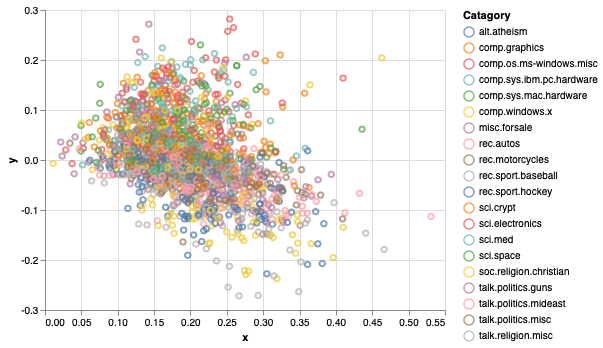

In [21]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Catagory").mark_point().interactive()

The plot above shows no clear clustering within classes. However, this is expected for a couple of reasons:
    1. We are mapping from a 2048 dimensional space down to 2 dimensions. This is a huge reduction in dimensions and as such we lose some information.
    2.  We are plotting 20 different catagories on one plot - it's difficult to see what's going on clearly with all those colours. 
    
Instead we want to plot each catagory individually agains all other catagories. This one-vs-all plot may enable us to see any clusters more clearly:

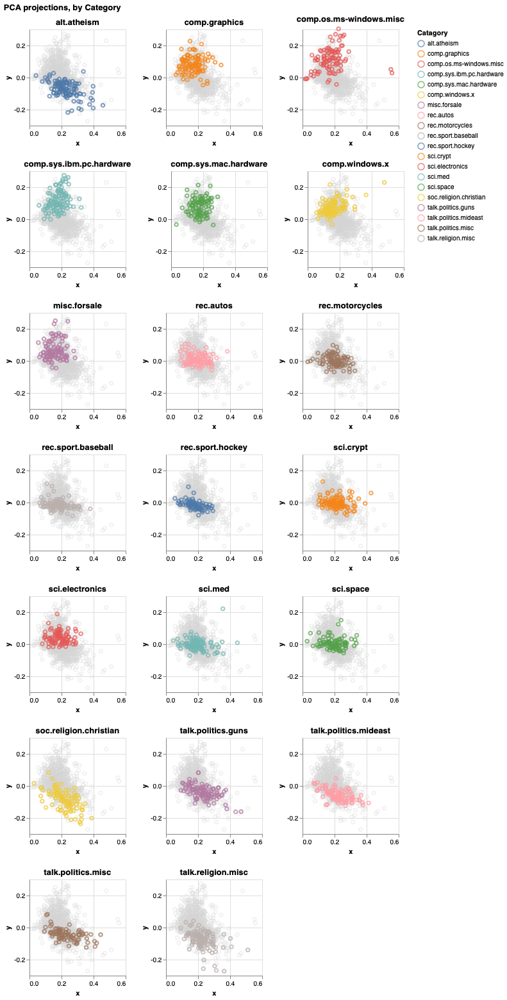

In [17]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 0.6))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Catagory:N'
)

chart1 = alt.Chart(data.sample(1000)) \
            .encode(x="x", y="y") \
            .mark_point(opacity=0.3, color="lightgray")

def overlay_make_chart(base_chart, catagory, options, chart1):
    title = catagory
    chart2 = base_chart\
      .transform_filter(datum.Catagory == catagory)\
      .properties(width=options['width'], 
                    height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


options = {'width': 150, 'height': 150}
charts = [overlay_make_chart(base, catagory, options, chart1) \
          for catagory in sorted(data.Catagory.unique())]

# make a single row
def make_chart_row(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    row = alt.HConcatChart(hconcat=hconcat)
    return row

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_chart_row(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

This facet plot indicates that there is structure in our feature vectors. PCA projections are clustering by catagory, thus indicating that our feature engineering approach is able to identify structure in our data. 

As such, we are happy with our feature engineering technique and will save the transformation steps as a pipeline stage. 

In [ ]:
from sklearn.pipeline import Pipeline 

BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()
feat_pipeline = Pipeline([('vect',hv), ('tfidf',tfidf)])

In [ ]:
from mlworkflows import util

util.serialize_to(feat_pipeline, "feature_pipeline.sav")